In [5]:
#Importer les Librairies traitement image 
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import skimage


#importer les librairies utilitaires 
import pathlib
import math
import random

9


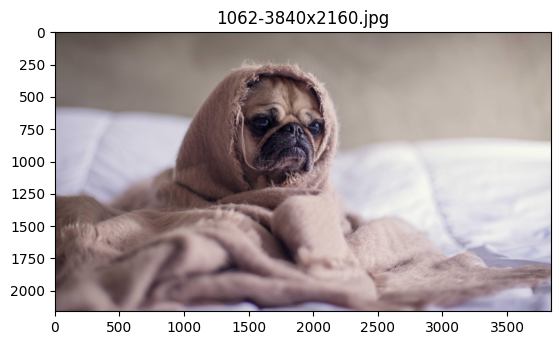

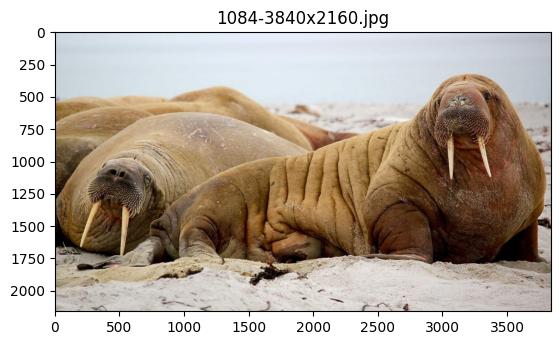

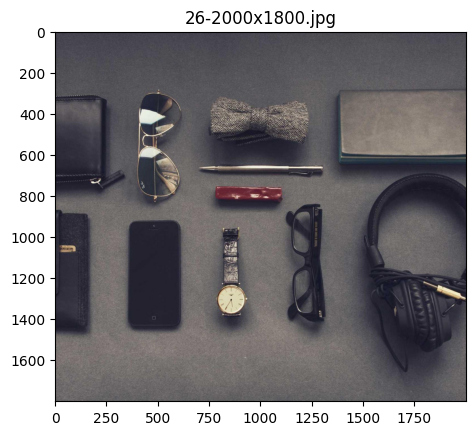

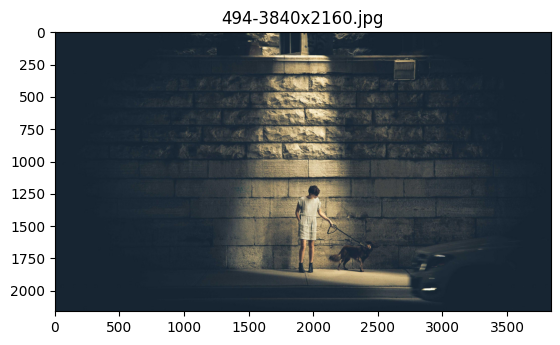

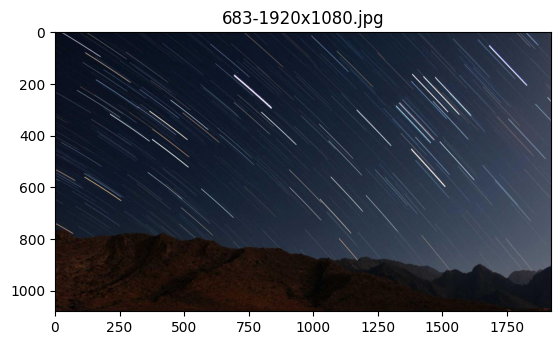

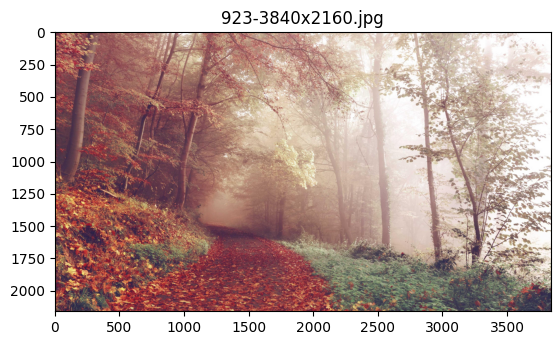

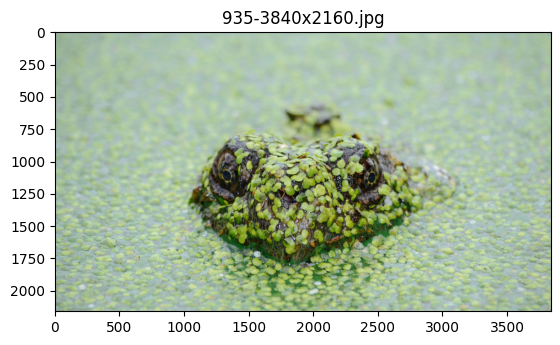

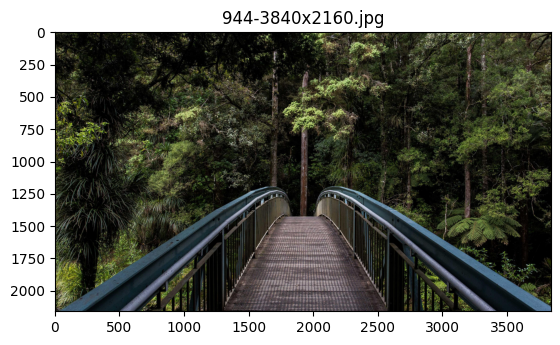

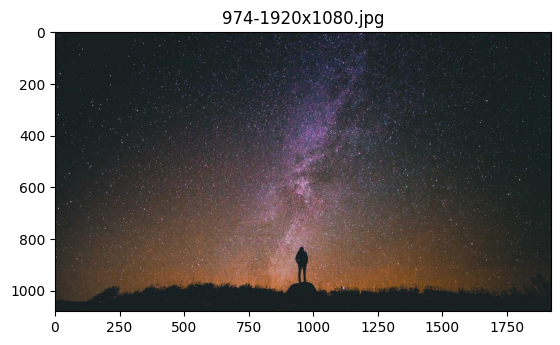

In [6]:
#chargement du dataset
images = [f for f in pathlib.Path('photo').iterdir()]

print(len(images))

#Affichage des images chachune dans un plot différent
for img in images : 
    plt.figure()

    plt.title(img.name)

    img = plt.imread(img)

    plt.imshow(img)

In [7]:
def chooseRandomImg():
    img = plt.imread(images[random.randint(0, len(images)-1)])
    
    return img

Text(0.5, 1.0, 'Image de croppé')

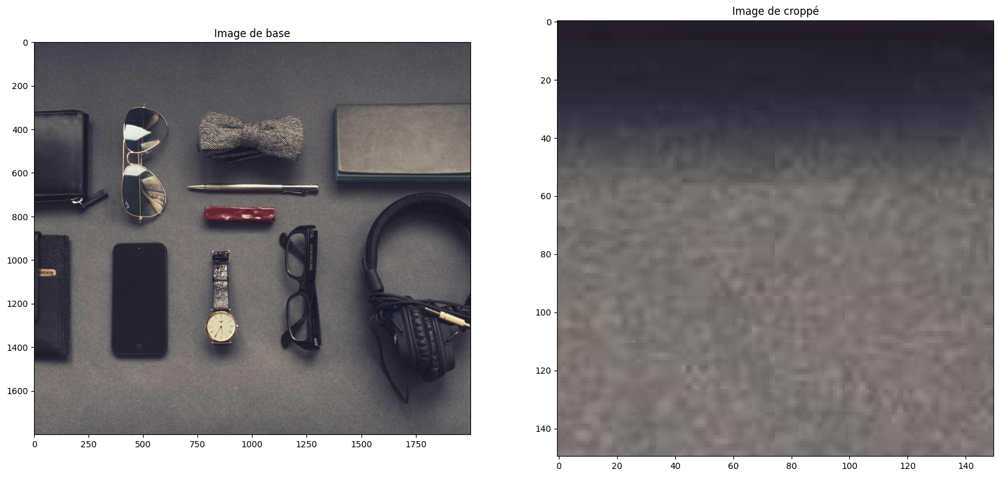

In [8]:
#Cropper les images
def center_crop(img, width = None, height = None):
    assert width or height, 'Précisez au moins une dimension'
    width = width or height
    height = height or width

    org_height, org_width = img.shape[:2] #(256, 185, 3)
    cropCenter_x, cropCenter_y = org_width// 2, org_height //2
    dimCrop_x, dimCrop_y = width // 2, height // 2

    return img[cropCenter_y-dimCrop_y : cropCenter_y + dimCrop_y, cropCenter_x-dimCrop_x : cropCenter_x + dimCrop_x] #[80, 250, :, :]

img = chooseRandomImg()

cropped_img = center_crop(img, 150)

fig, axs = plt.subplots(ncols = 2, nrows = 1, figsize = (20,20))

axs[0].imshow(img)
axs[0].set_title('Image de base')

axs[1].imshow(cropped_img)
axs[1].set_title('Image de croppé')

Text(0.5, 1.0, 'Image en N&B')

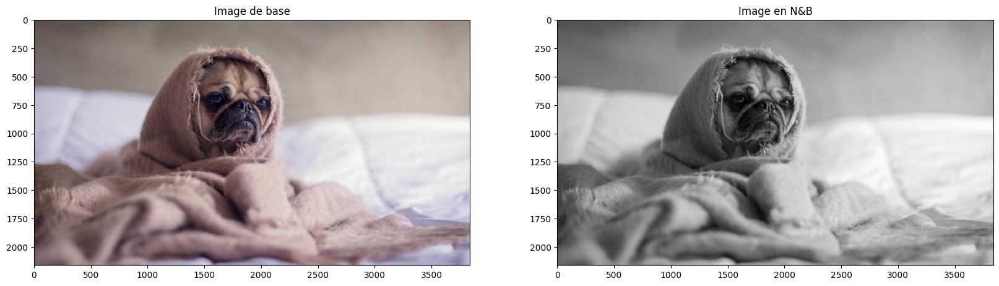

In [15]:
#Passage en grayscale

img = chooseRandomImg()

img_NB = skimage.color.rgb2gray(img)

fig, axs = plt.subplots(ncols = 2, nrows = 1, figsize = (20,20))

axs[0].imshow(img)
axs[0].set_title('Image de base')

axs[1].imshow(img_NB, cmap = plt.cm.gray)
axs[1].set_title('Image en N&B')


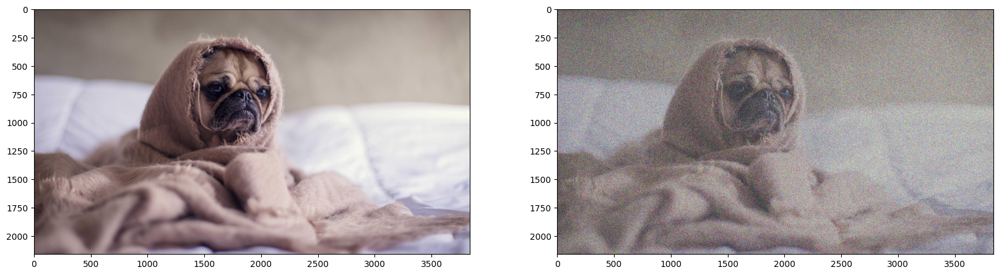

In [16]:
##Ajout de bruit

img=chooseRandomImg()
noise_img= skimage.util.random_noise(img, var=0.5)

fig, axs = plt.subplots(nrows=1 , ncols=2 , figsize=(20,20))

axs[0].imshow(img)
axs[1].imshow(noise_img)

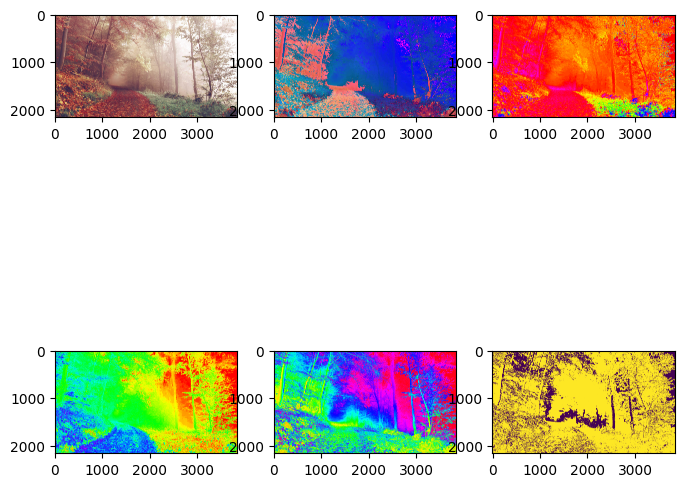

In [17]:
#Passage en HSV et seuillage
img=chooseRandomImg()
hsv_img=skimage.color.rgb2hsv(img)
hue_img=hsv_img[:,:,0]
sat_img=hsv_img[:,:,1]
val_img=hsv_img[:,:,2]

hue_threshold=0.04
val_threshold=0.02
bin_img=(hue_img > hue_threshold ) | (val_img < val_threshold)

cols=3
rows=2

fig, axs=plt.subplots(nrows=2, ncols=3, figsize=(8,8))

axs[0,0].imshow(img)
axs[0,1].imshow(hsv_img)
axs[0,2].imshow(hue_img, cmap='hsv')
axs[1,0].imshow(sat_img, cmap='hsv')
axs[1,1].imshow(val_img, cmap='hsv')
axs[1,2].imshow(bin_img)

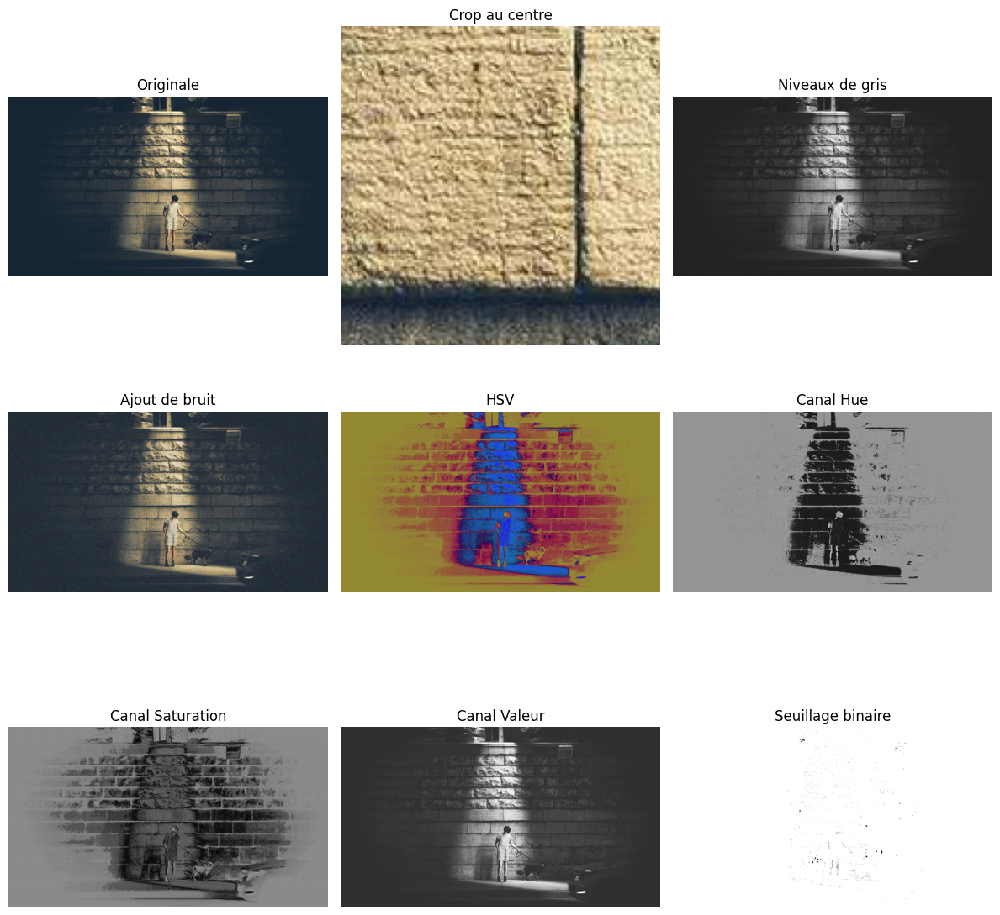

In [19]:
import matplotlib.pyplot as plt
import numpy as np
import skimage
import pathlib
import random

def chooseRandomImg():
    return plt.imread(images[random.randint(0, len(images)-1)])

def center_crop(img, width=None, height=None):
    assert width or height, 'Précisez au moins une dimension'
    width = width or height
    height = height or width
    org_height, org_width = img.shape[:2]
    cropCenter_x, cropCenter_y = org_width // 2, org_height // 2
    dimCrop_x, dimCrop_y = width // 2, height // 2
    return img[cropCenter_y-dimCrop_y : cropCenter_y + dimCrop_y, cropCenter_x-dimCrop_x : cropCenter_x + dimCrop_x]

# Chargement du dataset
images = [f for f in pathlib.Path('photo').iterdir()]

# Sélection d'une image aléatoire
img = chooseRandomImg()

# Création des différentes transformations
cropped_img = center_crop(img, 150)
img_gray = skimage.color.rgb2gray(img)
noise_img = skimage.util.random_noise(img, var=0.05)
hsv_img = skimage.color.rgb2hsv(img)
hue_img = hsv_img[:, :, 0]
sat_img = hsv_img[:, :, 1]
val_img = hsv_img[:, :, 2]
hue_threshold = 0.04
val_threshold = 0.02
bin_img = (hue_img > hue_threshold) | (val_img < val_threshold)

# Création de la figure et affichage des images
fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(12, 12))

image_list = [
    (img, 'Originale'),
    (cropped_img, 'Crop au centre'),
    (img_gray, 'Niveaux de gris'),
    (noise_img, 'Ajout de bruit'),
    (hsv_img, 'HSV'),
    (hue_img, 'Canal Hue'),
    (sat_img, 'Canal Saturation'),
    (val_img, 'Canal Valeur'),
    (bin_img, 'Seuillage binaire')
]

for ax, (image, title) in zip(axs.ravel(), image_list):
    cmap = 'gray' if len(image.shape) == 2 else None
    ax.imshow(image, cmap=cmap)
    ax.set_title(title)
    ax.axis('off')

plt.tight_layout()
plt.show()


9


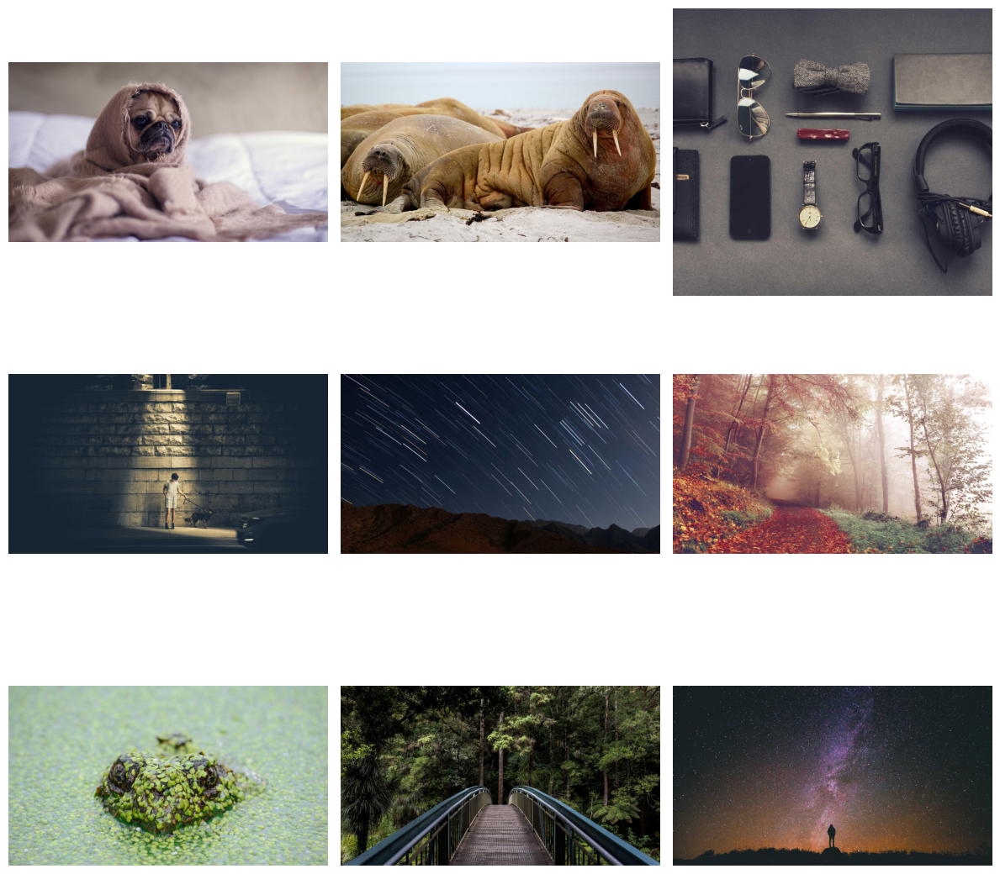

In [3]:
# Importation des librairies logicielles utilisées

# Librairies dédiées au traitement d'images
import skimage # scikit-image, qui contient toutes les fonctions que nous allons utiliser
import numpy as np # numpy, utilisée par scikit-image pour transformer les images en tableaux à plusieurs dimensions

# Librairies utilitaires
import pathlib # Pour charger automatiquement le dataset d'images
import math
import random
import matplotlib # matplotlib, pour l'affichage des images et graphiques
import matplotlib.pyplot as plt

# Chargement du dataset
images = [f for f in pathlib.Path('photo').iterdir()]
print(len(images)) # Affiche la longueur de la liste pour vérification

# Affichage de tout le dataset dans une figure sous forme de grille avec des subplots
colonnes = 3 # On veut une grille de trois colonnes
lignes = rows = math.ceil((len(images) - 1)/colonnes) # Et on calcule automatiquement l enombre de lignes nécessaires selon la taille du dataset

# On créée un objet contenant la figure globale, et un tableau à une ou deux dimensions d'objets axes
fig, axs = plt.subplots(ncols=colonnes, nrows=lignes, figsize=(12,12)) # L'argument figsize prend un couple de valeurs, et gère la taille d'affichage des subplots

# On boucle à travers les différents axes
for i, ax in enumerate(axs.flat): # L'option .flat permet de boucler à travers un tableau à deux dimensions avec un seul index
    ax.set_axis_off() # Cache les repères lors de l'affichage de l'image

    img = plt.imread(images[i])

    if img.ndim < 3: # Si l'image chargée possède moins de trois dimensions (image monocouche en noir et blanc)
        ax.imshow(img, cmap = plt.cm.gray) # On affiche l'image dans un espace colorimétrique correspondant
    else :
        ax.imshow(img)

fig.tight_layout() # Sert à réduire le plus possible les marges entre les images

Nombre d'images chargées : 9


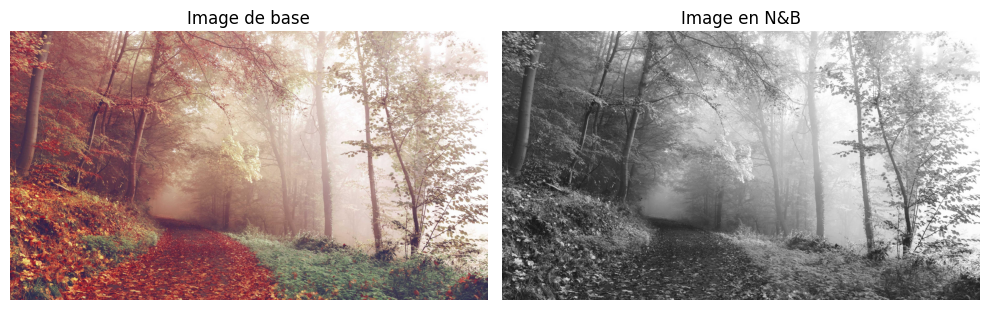

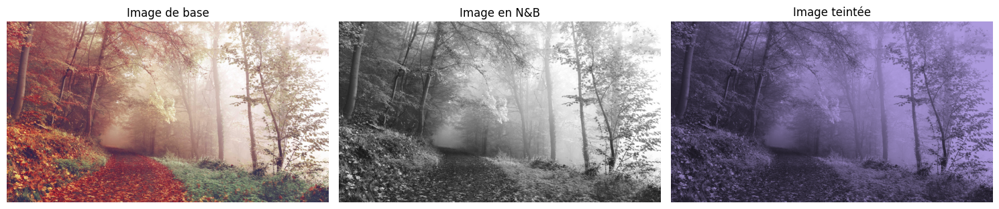

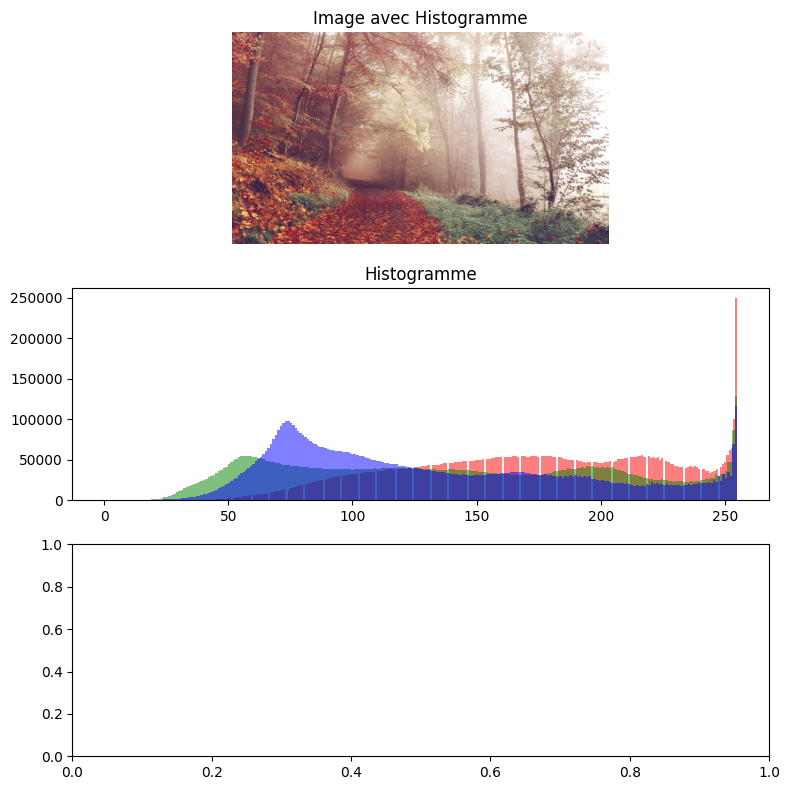

IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

In [ ]:
import pathlib
import random
import numpy as np
import skimage.io
import skimage.color
import skimage.exposure
import matplotlib.pyplot as plt

# Chargement des images depuis le dossier 'photo/'
images = list(pathlib.Path('photo').iterdir())
print(f"Nombre d'images chargées : {len(images)}")

# Fonction pour choisir une image aléatoire
def choose_random_img(images):
    img_path = random.choice(images)
    img = skimage.io.imread(img_path)
    return img_path.name, img

# Fonction d'affichage d'image et histogramme
def afficher_img_hist(img, axs, bins=256, titre=""):
    axs[0].imshow(img)
    axs[0].set_title(titre)
    axs[0].axis("off")
    
    # Histogramme
    if len(img.shape) == 3:  # Image couleur
        colors = ['r', 'g', 'b']
        for i, color in enumerate(colors):
            axs[1].hist(img[:, :, i].ravel(), bins=bins, color=color, alpha=0.5)
    else:  # Image en niveaux de gris
        axs[1].hist(img.ravel(), bins=bins, color='gray')
    
    axs[1].set_title("Histogramme")

# Conversion en niveaux de gris
titre, img = choose_random_img(images)
img_NB = skimage.color.rgb2gray(img)

fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(img)
axs[0].set_title('Image de base')
axs[0].axis("off")

axs[1].imshow(img_NB, cmap="gray")
axs[1].set_title('Image en N&B')
axs[1].axis("off")
plt.tight_layout()
plt.show()

# Teinture aléatoire d'image
img_Tint = skimage.color.gray2rgb(img_NB)  # Convertir en RGB
random_multiplier = np.random.rand(3)  # Facteurs aléatoires pour chaque canal
img_Tint *= random_multiplier  # Appliquer la teinture

fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].imshow(img)
axs[0].set_title('Image de base')
axs[0].axis("off")

axs[1].imshow(img_NB, cmap="gray")
axs[1].set_title('Image en N&B')
axs[1].axis("off")

axs[2].imshow(img_Tint)
axs[2].set_title('Image teintée')
axs[2].axis("off")

plt.tight_layout()
plt.show()

# Affichage des histogrammes
fig, axs = plt.subplots(3, 1, figsize=(8, 8))
afficher_img_hist(img, axs, 256, titre="Image avec Histogramme")
plt.tight_layout()
plt.show()

# Normalisation d'histogramme avec une image de référence
titreBase, imgBase = choose_random_img(images)
titreRef, imgRef = choose_random_img(images)
imgNormalisee = skimage.exposure.match_histograms(imgBase, imgRef, channel_axis=-1)

afficher_img_hist(imgBase, axs[:, 1], titre=titreBase)  # Première colonne
afficher_img_hist(imgRef, axs[:, 2], titre=titreRef)    # Deuxième colonne
afficher_img_hist(imgNormalisee, axs[:, 3], titre="Image Normalisée")  # Troisième colonne (à modifier si 2 colonnes seulement)



plt.tight_layout()
plt.show()

# Égalisation d'histogramme
p2, p98 = np.percentile(img, (2, 98))
imgStretch = skimage.exposure.rescale_intensity(img, in_range=(p2, p98))
imgAutoEq = skimage.exposure.equalize_hist(img)
imgAdapt = skimage.exposure.equalize_adapthist(img, clip_limit=0.03)

fig, axs = plt.subplots(4, 2, figsize=(12, 12))
afficher_img_hist(img, axs[:, 0], titre='Image de base')
afficher_img_hist(imgStretch, axs[:, 1], titre='Contrast Stretching')
afficher_img_hist(imgAutoEq, axs[:, 2], titre='Égalisation Automatique')
afficher_img_hist(imgAdapt, axs[:, 3], titre='Égalisation Adaptative')

plt.tight_layout()
plt.show()

In [ ]:
import pathlib
import random
import numpy as np
import skimage.io
import skimage.color
import skimage.exposure
import skimage.transform
import skimage.util
import skimage.filters
import skimage.restoration
import skimage.draw
import matplotlib.pyplot as plt

# Chargement des images depuis le dossier 'photo/'
image_paths = list(pathlib.Path('photo').iterdir())
print(f"Nombre d'images chargées : {len(image_paths)}")

# Fonction pour charger et redimensionner les images

def resize_and_crop(img, target_size=(512, 512)):
    h, w = img.shape[:2]
    scale = max(target_size[0] / h, target_size[1] / w)
    img_resized = skimage.transform.rescale(img, scale, anti_aliasing=True, channel_axis=-1)
    h_resized, w_resized = img_resized.shape[:2]
    start_x = (w_resized - target_size[1]) // 2
    start_y = (h_resized - target_size[0]) // 2
    return img_resized[start_y:start_y + target_size[0], start_x:start_x + target_size[1]]

# Charger et traiter les images
images = [resize_and_crop(skimage.io.imread(img_path)) for img_path in image_paths[:9]]

# Affichage des images en grille 3x3
fig, axes = plt.subplots(3, 3, figsize=(10, 10))
for ax, img in zip(axes.ravel(), images):
    ax.imshow(img)
    ax.axis("off")
plt.tight_layout()
plt.savefig("Grille_Images.png")
plt.show()

# Générer et afficher les histogrammes
fig, axes = plt.subplots(3, 3, figsize=(10, 10))
for ax, img in zip(axes.ravel(), images):
    if img.ndim == 3:
        for i, color in enumerate(['r', 'g', 'b']):
            ax.hist(img[:, :, i].ravel(), bins=256, color=color, alpha=0.5)
    else:
        ax.hist(img.ravel(), bins=256, color='gray')
plt.tight_layout()
plt.savefig("Grille_Histogrammes.png")
plt.show()

# Sélection d'une image aléatoire
img = random.choice(images)
img_gray = skimage.color.rgb2gray(img)

# Générer la grille 3x2 avec traitements
fig, axes = plt.subplots(2, 3, figsize=(12, 8))

# Ligne du haut : traitements N&B
axes[0, 0].imshow(img_gray, cmap='gray')
axes[0, 0].set_title("Image en N&B")
axes[0, 0].axis("off")

random_tint = np.random.rand(3)
tinted = skimage.color.gray2rgb(img_gray) * random_tint
axes[0, 1].imshow(tinted)
axes[0, 1].set_title("Teinte aléatoire")
axes[0, 1].axis("off")

hsv = skimage.color.rgb2hsv(img)
thresh = hsv[:, :, 2] > skimage.filters.threshold_otsu(hsv[:, :, 2])
axes[0, 2].imshow(thresh, cmap='gray')
axes[0, 2].set_title("Seuillage HSV")
axes[0, 2].axis("off")

# Ligne du bas : ajout de bruit et débruitage
noisy_img = skimage.util.random_noise(img, mode='gaussian')
den_noisy = skimage.restoration.denoise_nl_means(noisy_img, fast_mode=True)
axes[1, 0].imshow(den_noisy)
axes[1, 0].set_title("Denoising Moyennage")
axes[1, 0].axis("off")

noisy_img2 = skimage.util.random_noise(img, mode='s&p')
den_noisy2 = skimage.filters.median(noisy_img2)
axes[1, 1].imshow(den_noisy2)
axes[1, 1].set_title("Denoising autre méthode")
axes[1, 1].axis("off")

mask = np.zeros(img.shape[:2], dtype=bool)
rr, cc = skimage.draw.disk((256, 256), 50)
mask[rr, cc] = True
inpainted = skimage.restoration.inpaint_biharmonic(img, mask, channel_axis=-1)
axes[1, 2].imshow(inpainted)
axes[1, 2].set_title("Inpainting")
axes[1, 2].axis("off")

plt.tight_layout()
plt.savefig("Grille_Traitements.png")
plt.show()


FileNotFoundError: No such file: 'c:\Users\adril\Desktop\INFO Program\Traitement Image\image1.jpg'